# Reservoir Characterization Workflow Part 2: Core Calibration Data and Rock Typing

## Interrogation of the Core Calibration data used in this Carbonate Reservoir Characterization Workflow and Evaluation of Rock Typing (RT):

### Interrogate Rosetta Stone and Costa HPMI core calibration data using Python's Altair to create interactive plots, cross plots and histograms. Altair is one of the best interactive software python libraries that allows the user to select data from an assortment of plots and observe the selected data on other depth plots, cross plots and histograms using your own user-defined layout.

---
# Code
---

## Python Requirements:

In [26]:
import numpy as np
import pandas as pd

from pandas import DataFrame, read_csv
import altair as alt
#alt.renderers.enable('altair_viewer')

import altair_transform
alt.data_transformers.disable_max_rows()

import matplotlib.pyplot as plt

---
# Interrogate Core Reference Calibration Data using python's Altair


## Costa HW High Pressure Mercury Injection (HPMI) Core Data:
![RosettaStone](Costa_Pc2.gif)

### Read ther core HPMI data:

In [27]:
#read the file
file = r'./data/Costa_core_data2.xlsx'
#file = r'Pc_Results.xlsx'

df = pd.read_excel(file,index_col=False)

In [28]:
df.head()

,Sample,Class,no_pore_sys,closure_pick,Porosity,Perm,lPerm,Sw,PcOB,RRT,PcHg,lPc,Bvocc_old,BVOCC,lBVOCC,r35,lr35,ROCK_INDEX1,ROCK_INDEX
0,2,Good,1,0.01,21.6,0.31,-0.508638,1.0,0.056528,1 RRT,0.629879,-0.200743,0.0,0.01,-2.0,0.201551,-0.695615,2,2
1,2,Good,1,0.01,21.6,0.31,-0.508638,1.0,0.063311,1 RRT,0.705464,-0.151525,0.0,0.01,-2.0,0.201551,-0.695615,2,2
2,2,Good,1,0.01,21.6,0.31,-0.508638,1.0,0.071225,1 RRT,0.793647,-0.100372,0.0,0.01,-2.0,0.201551,-0.695615,2,2
3,2,Good,1,0.01,21.6,0.31,-0.508638,1.0,0.080269,1 RRT,0.894428,-0.048455,0.0,0.01,-2.0,0.201551,-0.695615,2,2
4,2,Good,1,0.01,21.6,0.31,-0.508638,1.0,0.090444,1 RRT,1.007806,0.003377,0.0,0.01,-2.0,0.201551,-0.695615,2,2


In [29]:
interval = alt.selection_interval()

base = alt.Chart(df).properties(
    width=300,
    height=375, 
).add_selection(interval)


#------------------------------------------------
#
#       Poro-Perm Cross Plot
#
#------------------------------------------------

kphi = alt.Chart(df).mark_point(filled=True, size=100).encode(
    #x='Porosity:Q',
    #y='lPerm:Q',

    alt.X('Porosity:Q',
        scale=alt.Scale(domain=(0, 40))
    ),    
    alt.Y('Perm:Q',scale=alt.Scale(type='log', base=10,domain=(.000001, 10000))),
    #size='lMode:Q',
    #color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),
    #                    scale=alt.Scale(
    #                   domain=[ 1,         2,         3,      4,      5,        6   ],
    #                    range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
    
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),
                        scale=alt.Scale(
                        domain=[ 1,         2,         3   ],
                        range =['cyan', 'yellow', 'brown'])),
    
    
    tooltip='r35:Q', 
).properties(
    width=350,
    height=450, 

    title='Porosity vs. Permeability Cross Plot (PRT on Color Axis)',
    selection=interval
)


#------------------------------------------------
#
#       Capillary Pressure Curves colored by PRT
#
#------------------------------------------------
pc = alt.Chart(df).mark_line(clip=True).encode(
    alt.X('BVOCC:Q',
        scale=alt.Scale(domain=(40, 0))
    ),    
    alt.Y('PcHg:Q',scale=alt.Scale(type='log', base=10,domain=(1, 10000))),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),scale=alt.Scale(scheme='rainbow')),
    tooltip='Mode:Q', 
    strokeDash='Sample:N',
).properties(
    title='Pc Curves with PRT on Color Axis (Upscaled Pc curve is thick Black Curve)',
    width=350,
    height=450, 
    
).transform_filter(
    interval
)

# ...
#x=alt.X(field='Acceleration', aggregate='mean', type='quantitative'),
#    mean_acc='mean(Acceleration)',
# ...


pc2 = alt.Chart(df).mark_line(clip=True,strokeWidth=3).encode(
    alt.X('mean(BVOCC)', type='quantitative', scale=alt.Scale(domain=(40, 0))
         ),
    alt.Y('PcHg:Q',scale=alt.Scale(type='log', base=10,domain=(1, 10000))),
    color=alt.value('black'),
).properties(
    #title='Upscaled Pc Curve with PRT as Color Axis',
    width=350,
    height=450, 
    
).transform_filter(
    interval
)
    

#------------------------------------------------
#
#       Define Plot Regions for Altair
#
#------------------------------------------------

kphihist = kphi  

#pchist = pc + pc2 | hist_bv & ptd2

pchist = pc 
#pchist = pc + pc2 |  hist_g2 & hist_bv1 & hist_bv2

#ptdplot = ptd2


plot = kphihist | pchist
#plot = kphihist & pchist & ptdplot


plot


alt.HConcatChart(...)

---
# Interrogate Core Reference Calibration Data using python's Altair on Clerke's Arab D Rosetta Stone Core Database by Sample Plot:

![RosettaStone](Thomeer_Pc_and_Thomeer_Parameters2.gif)

---
# The Theory:
## Using Clerke’s Arab D Rosetta Stone data with Clerke’s Petrophysical Rock Types (PRT) to compare to Winland r35 and Amaefule RQI and FZI

From Clerke’s Rosetta Stone Arab D carbonate dataset most macro rock typically has a dual porosity system as indicated by the Pore Throat Distribution (PTD) that has two modes as shown below: 

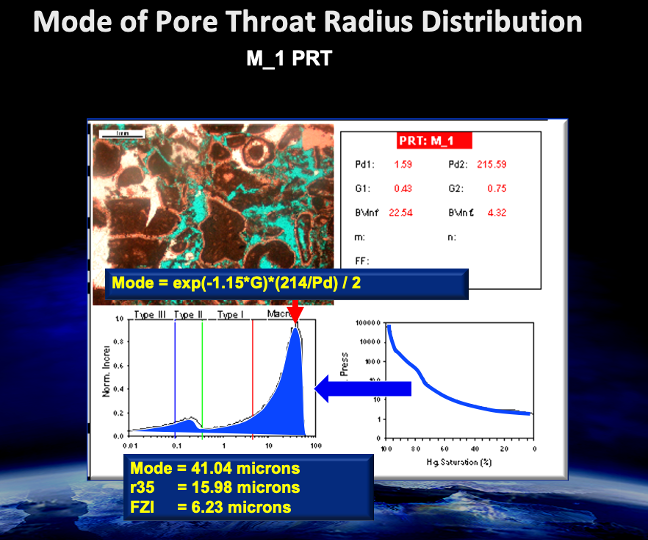

The macro portion of the rock will have a mode greater than 2 microns with a second (or third) mode less than 2 microns for the other pore systems. Probably the most abundant PRT is the M_1. This is a macro-porous rock with a mode in the macro portion of the PTD and a second mode in the meso-porosity range. In this M_1 PRT, both the macro pores and meso-porous grains can contain oil saturations once the reservoir capillary pressure is great enough to drive out the water. The M_2 PRT is also a macro porous rock, but the second pore system is micro-porous and is too tight to have hydrocarbon saturations. 

The following are some example results using Altair where the data in cross plots can be selected and then the appropriate data for those selected samples are shown in the histograms below the cross plots.   

![rock_typing_hist.gif](rock_typing_hist.gif)

### Petrophysical Rock Typing (PRT):

**One of the benefits of working with Thomeer parameters is that the exact mode of the PTD (radius) can be calculated for each sample using the Buiting Mode equation as shown below:**

        Mode(microns) = (exp(-1.15 * G) * (214/Pd))/2
        
The above equation gives us the mode of the pore system, and we normally only calculate the mode for the largest pore system for the sample. 

In the Altair plots below, the first row of porosity-permeability cross plots shows the PRT on the left and actual Mode of Pore Throats on the Z or color axis on the right. The second row of cross plots show the Winland r35, Amaefule FZI and RQI on the color axis.

In Rock Typing Winland’s r35 and Amaefule's FZI or RQI attempt to predict the most dominant pore throat. With our Rosetta Stone dataset, the dual-porosity carbonates indicate that Winland's r35 is usually close to the actual mode of the PTD, but FZI and RQI are much lower in values.

Windland's r35 is calculated:

        r35(microns) = 10**(0.732 + 0.588*log(Permeability) - 0.864*log(Porosity*100))


Amaefule-Kersey FZI is calculated:

        RQI(microns) = 0.0314 * sqrt(Permeability/Porosity)
        
        Phiz = Porosity / (1 - Porosity)

        FZI(microns) = RQI / Phiz
    
where Porosity is a volume fraction and not percent. 

On this dataset it appears that r35 has the best match to the actual mode of the Pore Throat Distribution from the Buiting Mode equation. The bimodality in the macro-porous rock has FZI falling between the two modes since FZI is the mean pore throat radius. Windland's r35 does a fairly good job of estimating the most dominant pore throat in this Rosetta Stone Calibration dataset.  


## PRT in Relationship with Mode of Pore Throat Distribution, Winland r35, Amaefule FZI and RQI:
### Read in Rosetta Stone Arab D Carbonate Database from file:

---
# Example of viewing Capillary Pressure (Pc) Curves and Thomeer Pc Parameters according to the sample's position in Poro-Perm Space:

**This eample gives us an idea of the magnitude of the Thomeer parameters from a narrow range of selected samples from the porosity-permeability cross plot. In our proposed workflow we actually estimate the appropriate Thomeer parameters with kNN using 3-5 nearest neighbors, but the following plot gives us a visualization of appropriate Thomeer parameters for a selected group of samples.**

### First Import Capillary Pressure Curves with Thomeer Parameters from a core database from Excel Reference File:

In [2]:
#read the file
file = r'./data/Pc_Results.xlsx'
df = pd.read_excel(file,index_col=False)

## Then, prepare the Altair layouts for these data:

In [3]:
interval = alt.selection_interval()

base = alt.Chart(df).properties(
    width=300,
    height=375, 
).add_selection(interval)


#------------------------------------------------
#
#       Poro-Perm Cross Plot
#
#------------------------------------------------

kphi = alt.Chart(df).mark_point(filled=True, size=100).encode(
    #x='Porosity:Q',
    #y='lPerm:Q',

    alt.X('Porosity:Q',
        scale=alt.Scale(domain=(0, 0.35))
    ),    
    alt.Y('Permeability:Q',scale=alt.Scale(type='log', base=10,domain=(.0001, 10000))),
    #size='lMode:Q',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
    tooltip='Mode:Q', 
).properties(
    width=400,
    height=500, 

    title='Porosity vs. Permeability Cross Plot (PRT on Color Axis)',
    selection=interval
)


#------------------------------------------------
#
#       Capillary Pressure Curves colored by PRT
#
#------------------------------------------------
pc = alt.Chart(df).mark_line(clip=True).encode(
    alt.X('BVOCC:Q',
        scale=alt.Scale(domain=(30, 0))
    ),    
    alt.Y('Pc:Q',scale=alt.Scale(type='log', base=10,domain=(1, 10000))),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),scale=alt.Scale(scheme='rainbow')),
    tooltip='Mode:Q', 
    strokeDash='Sample:N',
).properties(
    title='Pc Curves with PRT on Color Axis (Upscaled Pc curve is thick Black Curve)',
    width=400,
    height=500, 
    
).transform_filter(
    interval
)

pc2 = alt.Chart(df).mark_line(clip=True,strokeWidth=6).encode(
    alt.X('BVOCC:Q', aggregate='mean',
          scale=alt.Scale(domain=(30, 0))
         ),
    alt.Y('Pc:Q',scale=alt.Scale(type='log', base=10,domain=(1, 10000))),
    color=alt.value('black'),
).properties(
    #title='Upscaled Pc Curve with PRT as Color Axis',
    width=400,
    height=500, 
    
).transform_filter(
    interval
)
    
#------------------------------------------------
#
#       Pore Throat Distributions
#
#------------------------------------------------
ptd2 = base.mark_line( clip=True).encode(
    alt.X('Microns:Q',
        scale=alt.Scale(type='log', base=10,domain=(.01, 100))
    ),    
    alt.Y('dBv:Q',
        scale=alt.Scale(domain=(0, 15))
    ),    
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),scale=alt.Scale(scheme='rainbow')),
    strokeDash='Sample:N',
).properties(
    title='Pore Throat Distribution (Microns)',
    width=400,
    height=125,
).transform_filter(
    interval
)


ptd2b = base.mark_line( clip=True).encode(
    alt.X('Microns:Q',
        scale=alt.Scale(type='log', base=10,domain=(.01, 100))
    ),    
    alt.Y('dBv:Q',aggregate='mean',
        scale=alt.Scale(domain=(0, 15))
    ),    
     color=alt.value('black'),
    #strokeDash='Sample:N',
).properties(
    title='Pore Throat Distribution (Microns)',
    width=400,
    height=125,
).transform_filter(
    interval
)



#------------------------------------------------
#
#       Various Other Plots and Histograms
#
#------------------------------------------------
hist_pd1 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('PD1',scale=alt.Scale(type='log', base=10,domain=(1, 10000))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 30))),    
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgreen'),scale=alt.Scale(scheme='rainbow')),
    #strokeDash='Sample:N'
).properties(
    title='Pd1 of Selected Samples',
    width=400,
    height=125,
    #selection=interval
).transform_filter(
    interval
)

hist_pd1b = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('PD1', aggregate='median', scale=alt.Scale(type='log', base=10,domain=(1, 10000))),
    #x='rock_index:O',
    #y='lmode:Q', 
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 40))),
    color=alt.value('black'),
    #strokeDash='Sample:N'
).properties(
    title='Pd1 of Selected Samples',
    width=400,
    height=125,
    #selection=interval
).transform_filter(
    interval
)



hist_pd2 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('PD2',scale=alt.Scale(type='log', base=10,domain=(1, 10000))),
    #x='rock_index:O',
    #y='lmode:Q',
    alt.Y('count()',scale=alt.Scale(domain=(0, 40))),
    #y='count()',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('green'),scale=alt.Scale(scheme='rainbow')),
    #strokeDash='Sample:N'
).properties(
    title='Pd2 of Selected Samples',
    width=400,
    height=125,
    #selection=interval
).transform_filter(
    interval
)


hist_pd2b = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('PD2', aggregate='median', scale=alt.Scale(type='log', base=10,domain=(1, 10000))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 40))),
    color=alt.value('black'),
    #strokeDash='Sample:N'
).properties(
    title='Pd2 of Selected Samples',
    width=400,
    height=125,
    #selection=interval
).transform_filter(
    interval
)




hist_g1 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('G1',scale=alt.Scale(domain=(0, 2))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 40))),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('orange'),scale=alt.Scale(scheme='rainbow')),
    #strokeDash='Sample:N'
).properties(
    title='G1 of Selected Samples',
    width=400,
    height=125,
    #selection=interval
).transform_filter(
    interval
)

hist_g1b = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('G1',aggregate='median',scale=alt.Scale(domain=(0, 2))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 40))),
    color=alt.value('black'),
    #strokeDash='Sample:N'
).properties(
    title='G1 of Selected Samples',
    width=400,
    height=125,
    #selection=interval
).transform_filter(
    interval
)





hist_g2 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('G2',scale=alt.Scale(domain=(0, 2))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 40))),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('brown'),scale=alt.Scale(scheme='rainbow')),
    #strokeDash='Sample:N'
).properties(
    title='G2 of Selected Samples',
    width=400,
    height=125,
    #selection=interval
).transform_filter(
    interval
)
hist_g2b = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('G2',aggregate='median',scale=alt.Scale(domain=(0, 2))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 40))),
    color=alt.value('black'),
    #strokeDash='Sample:N'
).properties(
    title='G2 of Selected Samples',
    width=400,
    height=125,
    #selection=interval
).transform_filter(
    interval
)



hist_bv1 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('BV1',scale=alt.Scale(domain=(0, 30))),
    #x='rock_index:O',
    #y='lmode:Q',
    y='count()',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('cyan'),scale=alt.Scale(scheme='rainbow')),
    #strokeDash='Sample:N'
).properties(
    title='BV1 of Selected Samples',
    width=400,
    height=125,
    #selection=interval
).transform_filter(
    interval
)

hist_bv2 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('BV2',scale=alt.Scale(domain=(0, 30))),
    #x='rock_index:O',
    #y='lmode:Q',
    y='count()',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('blue'),scale=alt.Scale(scheme='rainbow')),
    #strokeDash='Sample:N'
).properties(
    title='BV2 of Selected Samples',
    width=400,
    height=125,
    #selection=interval
).transform_filter(
    interval
)

#------------------------------------------------
#
#       Define Plot Regions for Altair
#
#------------------------------------------------

kphihist = kphi | hist_pd1+hist_pd1b & hist_pd2+hist_pd2b & hist_g1+hist_g1b 

#pchist = pc + pc2 | hist_bv & ptd2

pchist = pc + pc2 |  hist_g2+hist_g2b  & ptd2 
#pchist = pc + pc2 |  hist_g2 & hist_bv1 & hist_bv2

#ptdplot = ptd2


plot = kphihist & pchist
#plot = kphihist & pchist & ptdplot


plot



alt.VConcatChart(...)

In [4]:
#read the file
file = r'./data/RosettaStone_Arab_D.xlsx'
df = pd.read_excel(file,index_col=False)

## Altair Plot of Rosetta Stone data comparing to other Rock Typing methods:

In [5]:
interval = alt.selection_interval()

base = alt.Chart(df).properties(
    width=250,
    height=300, 
).add_selection(interval)

#------------------------------------------------
#
#       Poro-Perm Cross Plot
#
#------------------------------------------------
prt = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
    tooltip='ROCK_INDEX', 
).properties(
    title="Clerke's PRT as Color Axis",
    selection=interval
)

pointsMode = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    #size='lMode:Q',
    color=alt.condition(interval, 'lMode:Q', alt.value('lightgray'),scale=alt.Scale(
        domain=[-3,2],scheme='rainbow'),legend=None),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='Mode:Q', 
).properties(
    title='Actual Mode of PTD shown as Color Axis',
    selection=interval
)



pointsr35 = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    #size='lr35:Q',
    color=alt.condition(interval, 'lr35:Q', alt.value('lightgray'),scale=alt.Scale(
        domain=[-3,2],scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='Winland_r35:Q', 
).properties(
    title='Winland r35 on Color Axis',
    selection=interval
)

pointsFZI = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    #size='lFZI:Q',
    color=alt.condition(interval, 'lFZI:Q', alt.value('lightgray'),scale=alt.Scale(
        domain=[-3,2],scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='FZI:Q', 
).properties(
    title='FZI on Color Axis',
    selection=interval
)

pointsRQI = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    #size='lRQI:Q',
    color=alt.condition(interval, 'lRQI:Q', alt.value('lightgray'),scale=alt.Scale(
        domain=[-3,2],scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='RQI:Q', 
).properties(
    title='RQI on Color Axis',
    selection=interval
)

#------------------------------------------------
#
#       Various Other Histograms by PRT
#
#------------------------------------------------
hist1 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('Mode:Q',
          scale=alt.Scale(type='log',domain=(.001, 100))
        ),    
    alt.Y('count():Q',scale=alt.Scale(domain=(0.0, 1.))),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),                        
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
).properties(
    title="Histogram of Clerke's Mode by Pore Throat Distribution in microns",
    width=800,
    height=80
).transform_filter(
    interval
)

hist1a = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('Mode', aggregate='median', scale=alt.Scale(type='log', base=10,domain=(0.001, 100))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 1))),
    color=alt.value('black'),
    #strokeDash='Sample:N'
).properties(
    title='Mode',
    width=800,
    height=80,
    #selection=interval
).transform_filter(
    interval
)



hist2 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('Winland_r35:Q',
            scale=alt.Scale(type='log',domain=(.001, 100))
        ),    
    alt.Y('count():Q',scale=alt.Scale(domain=(0.0, 1.))),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),                        
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
).properties(
    title='Winland r35 (microns)',
    width=800,
    height=80
).transform_filter(
    interval
)

hist2a = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('Winland_r35', aggregate='median', scale=alt.Scale(type='log', base=10,domain=(0.001, 100))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 1))),
    color=alt.value('black'),
    #strokeDash='Sample:N'
).properties(
    title='Winland_r35',
    width=800,
    height=80,
    #selection=interval
).transform_filter(
    interval
)



hist3 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('FZI:Q',
            scale=alt.Scale(type='log',domain=(.001, 100))
        ),    
    alt.Y('count():Q',scale=alt.Scale(domain=(0.0, 1.))),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),                        
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
).properties(
    title='Amaefule FZI (microns)',
    width=800,
    height=80
).transform_filter(
    interval
)

hist3a = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('FZI', aggregate='median', scale=alt.Scale(type='log', base=10,domain=(0.001, 100))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 1))),
    color=alt.value('black'),
    #strokeDash='Sample:N'
).properties(
    title='FZI',
    width=800,
    height=80,
    #selection=interval
).transform_filter(
    interval
)



hist4 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('RQI:Q',
            scale=alt.Scale(type='log',domain=(.001, 100))
        ),    
    alt.Y('count():Q',scale=alt.Scale(domain=(0.0, 1.))),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),                        
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
).properties(
    title='Amaefule RQI',
    width=800,
    height=80
).transform_filter(
    interval
)

hist4a = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('RQI', aggregate='median', scale=alt.Scale(type='log', base=10,domain=(0.001, 100))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 1))),
    color=alt.value('black'),
    #strokeDash='Sample:N'
).properties(
    title='RQI',
    width=800,
    height=80,
    #selection=interval
).transform_filter(
    interval
)




thomeer2 = prt | pointsMode

scatter2 = pointsr35 | pointsFZI | pointsRQI

#plot2 = thomeer2 & scatter2

plot2 = thomeer2 & scatter2 & hist1+hist1a & hist2+hist2a & hist3+hist3a & hist4+hist4a 

plot2

alt.VConcatChart(...)

---
---
# Michael Krief has provided a cross plot on LinkedIn that showed an excellent correlation for his Mode of the PTD vs. sqrt(k/phi):

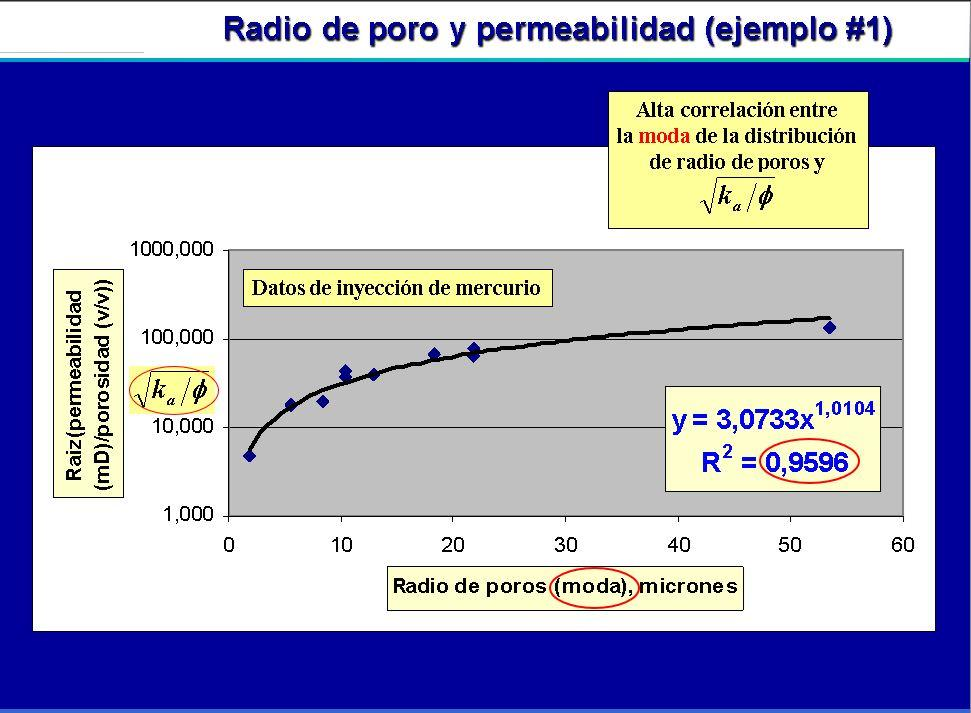


We added his equation to our plots below, and his mode does agree with our actual Mode of the PTD from Buiting's Mode equation extremely well. In the plots far below, one of the Porosity vs. Permeability cross plot has Krief's mode on the z axis as a color scaled as the other plots. One of the histograms toward the bottom also has his mode equation which is shown below:

    Mode = (sqrt(k/phi)/3.0733)**(1/1.0104)

where the Porosity is in V/V and Permeability is in mD.  This is quite impressive. We has asked Michel to provide additional details on his work, and we thank him for his input.

## The following is a cross plot of Krief's Mode calculated from his equation vs. sqrt(k/phi):

**We fit his equation shown on his image plot to be sure we had it right.**

Linearl Fit: y = a*x**b
	a = popt[0] = 3.073300000000001
	b = popt[1] = 1.0104
        r2 = 1.0



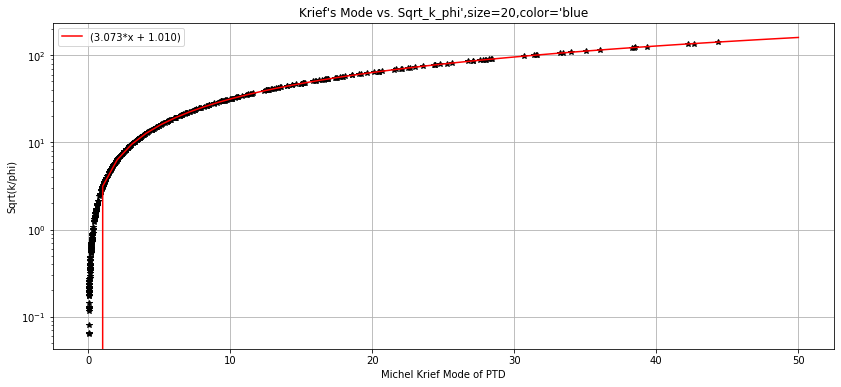

In [6]:
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit


newX = np.linspace(0,50 )

def myExpFunc(x, a, b):
    return a*x**b

popt, pcov = curve_fit(myExpFunc, df['Michel'],df['sqrt_k_phi'])
print("Linearl Fit: y = a*x**b")
print("\ta = popt[0] = {0}\n\tb = popt[1] = {1}".format(*popt))

# r2 calculations https://newbedev.com/getting-the-r-squared-value-using-curve-fit
#residuals = ydata- f(xdata, *popt)
#ss_res = np.sum(residuals**2)
#ss_tot = np.sum((ydata-np.mean(ydata))**2)
#r_squared = 1 - (ss_res / ss_tot)
residuals = df['sqrt_k_phi']- myExpFunc(df['Michel'], *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((df['sqrt_k_phi']-np.mean(df['sqrt_k_phi']))**2)
r_squared = 1 - (ss_res / ss_tot)
print('        r2 =',round(r_squared,3))
print()


plt.figure(figsize=(14,6))
plt.semilogy(df['Michel'],df['sqrt_k_phi'],'k*')
plt.semilogy(newX, myExpFunc(newX, *popt), 'r-', label="({0:.3f}*x + {1:.3f})".format(*popt))
plt.ylabel('Sqrt(k/phi)')
plt.xlabel('Michel Krief Mode of PTD')
plt.title("Krief's Mode vs. Sqrt_k_phi',size=20,color='blue")
plt.grid(True)
plt.legend()
plt.show()

## Compare Krief's Mode vs. Buiting's Actual Mode Calculated from the Thomeer Parameters:

    **The Scipy curve_fit regrression results on this plot are very misleading, and that is why we have included Geolog's fit equation**

Exponential Fit: y = a*(x**b)
	a = popt[0] = 2.520025463740945
	b = popt[1] = 0.7946584964287073
        Geolog r2 = 0.56 ???



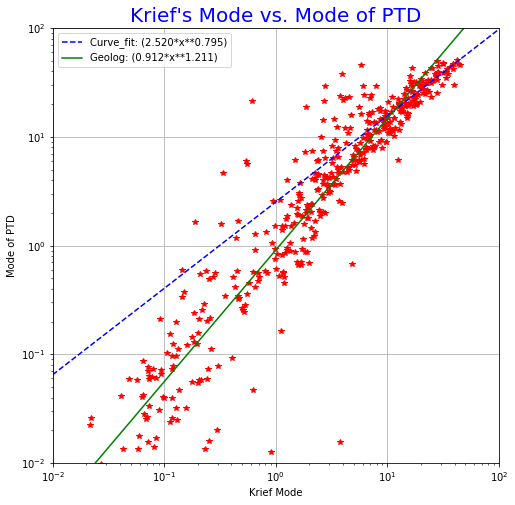

In [7]:
newX = np.logspace(-2, 3, base=10)


# Let's fit an exponential function.  
# This looks like a line on a lof-log plot.
def myExpFunc(x, a, b):
    return a * np.power(x, b)

popt, pcov = curve_fit(myExpFunc, df['Michel'],df['Mode'])

print("Exponential Fit: y = a*(x**b)")
print("\ta = popt[0] = {0}\n\tb = popt[1] = {1}".format(*popt))

plt.figure(figsize=(8,8))
plt.loglog(df['Michel'],df['Mode'],'r*')
plt.loglog(newX, myExpFunc(newX, *popt), 'b--', 
         label="Curve_fit: ({0:.3f}*x**{1:.3f})".format(*popt))

# Geolog fit added to plot
popt[0]=0.912
popt[1]=1.211
plt.loglog(newX, myExpFunc(newX, *popt), 'g-', 
         label="Geolog: ({0:.3f}*x**{1:.3f})".format(*popt))

# r2 calculations https://newbedev.com/getting-the-r-squared-value-using-curve-fit
#residuals = ydata- f(xdata, *popt)
#ss_res = np.sum(residuals**2)
#ss_tot = np.sum((ydata-np.mean(ydata))**2)
#r_squared = 1 - (ss_res / ss_tot)
residuals = df['Mode']- myExpFunc(df['Michel'], *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((df['Mode']-np.mean(df['Mode']))**2)
r_squared = 1 - (ss_res / ss_tot)
print('        Geolog r2 =',round(r_squared,3),'???')
print()



plt.xlim(0.01,100)
plt.ylim(0.01,100)
plt.xlabel('Krief Mode')
plt.ylabel('Mode of PTD')
plt.title("Krief's Mode vs. Mode of PTD",size=20,color='blue')
plt.grid(True)
plt.legend()
plt.show()

## Try this as semilogy plot:

Exponential Fit: y = a*(x**b)
	a = popt[0] = 2.520025463740945
	b = popt[1] = 0.7946584964287073
        r2 = 0.836



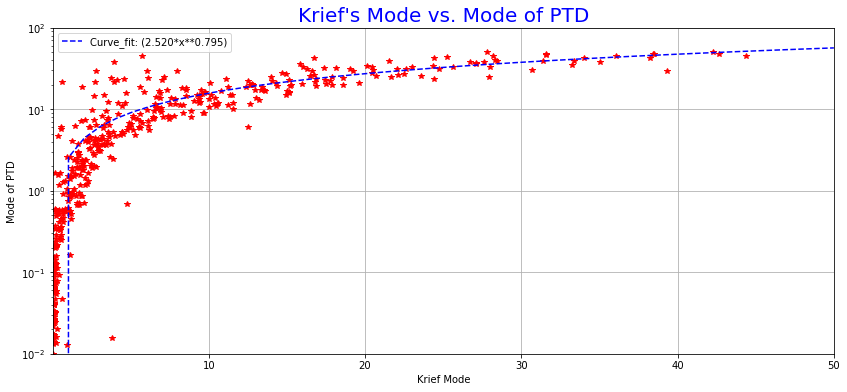

In [8]:
newX = np.linspace(0, 50)


# Let's fit an exponential function.  
# This looks like a line on a lof-log plot.
def myExpFunc(x, a, b):
    return a * np.power(x, b)

popt, pcov = curve_fit(myExpFunc, df['Michel'],df['Mode'])

print("Exponential Fit: y = a*(x**b)")
print("\ta = popt[0] = {0}\n\tb = popt[1] = {1}".format(*popt))

#r2 calculations https://newbedev.com/getting-the-r-squared-value-using-curve-fit
#residuals = ydata- f(xdata, *popt)
#ss_res = np.sum(residuals**2)
#ss_tot = np.sum((ydata-np.mean(ydata))**2)
#r_squared = 1 - (ss_res / ss_tot)
residuals = df['Mode']- myExpFunc(df['Michel'], *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((df['Mode']-np.mean(df['Mode']))**2)
r_squared = 1 - (ss_res / ss_tot)
print('        r2 =',round(r_squared,3))
print()


plt.figure(figsize=(14,6))
plt.semilogy(df['Michel'],df['Mode'],'r*')
plt.semilogy(newX, myExpFunc(newX, *popt), 'b--', 
         label="Curve_fit: ({0:.3f}*x**{1:.3f})".format(*popt))
plt.xlim(0.01,50)
plt.ylim(0.01,100)
plt.xlabel('Krief Mode')
plt.ylabel('Mode of PTD')
plt.title("Krief's Mode vs. Mode of PTD",size=20,color='blue')
plt.grid(True)
plt.legend()
plt.show()

## Now we will try the same with our Buiting Mode vs. sqrt(k/phi):

Linearl Fit: y = a*x**b
	a = popt[0] = 1.8274413051181495
	b = popt[1] = 1.0430132885266907
        r2 = 0.821



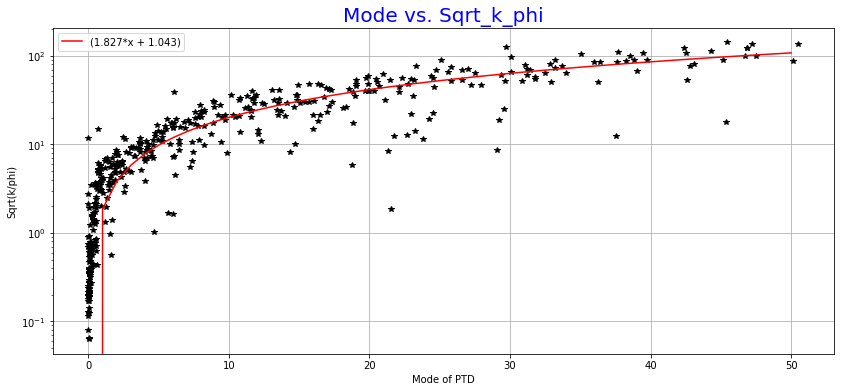

In [9]:
newX = np.linspace(0,50 )

def myExpFunc(x, a, b):
    return a*x**b

popt, pcov = curve_fit(myExpFunc, df['Mode'],df['sqrt_k_phi'])
print("Linearl Fit: y = a*x**b")
print("\ta = popt[0] = {0}\n\tb = popt[1] = {1}".format(*popt))

#r2 calculations https://newbedev.com/getting-the-r-squared-value-using-curve-fit
#residuals = ydata- f(xdata, *popt)
#ss_res = np.sum(residuals**2)
#ss_tot = np.sum((ydata-np.mean(ydata))**2)
#r_squared = 1 - (ss_res / ss_tot)
residuals = df['sqrt_k_phi']- myExpFunc(df['Mode'], *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((df['sqrt_k_phi']-np.mean(df['sqrt_k_phi']))**2)
r_squared = 1 - (ss_res / ss_tot)
print('        r2 =',round(r_squared,3))
print()


plt.figure(figsize=(14,6))
plt.semilogy(df['Mode'],df['sqrt_k_phi'],'k*')
plt.semilogy(newX, myExpFunc(newX, *popt), 'r-', label="({0:.3f}*x + {1:.3f})".format(*popt))
plt.ylabel('Sqrt(k/phi)')
plt.xlabel('Mode of PTD')
plt.title('Mode vs. Sqrt_k_phi',size=20,color='blue')
plt.grid(True)
plt.legend()
plt.show()

---
## We then fit a linear equation to the log10(sqrt(k/phi) vs. log10(Mode):

**and we used this Scipy curve_fit reqression equation to create a curve called Phillips**

### Scipy curve_fit does not perform well on a loglog plot. We should only use the curve_fit from the log10 of the data in a linear plot function.

Linearl Fit: y = m*x + b)
	a = popt[0] = 1.1569308821424962
	b = popt[1] = -0.5796491037185992
        r2 = 0.871



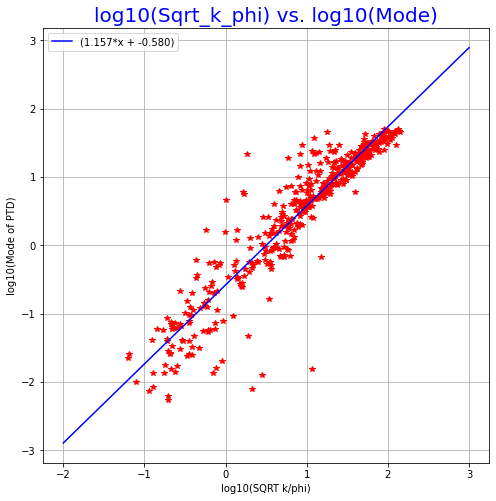

In [10]:
newX = np.linspace(-2,3 )


def myExpFunc(x, m, b):
    return x * m  +  b
popt, pcov = curve_fit(myExpFunc, df['lsqrt_k_phi'],df['lMode'])
print("Linearl Fit: y = m*x + b)")
print("\ta = popt[0] = {0}\n\tb = popt[1] = {1}".format(*popt))

# r2 calculations https://newbedev.com/getting-the-r-squared-value-using-curve-fit
#residuals = ydata- f(xdata, *popt)
#ss_res = np.sum(residuals**2)
#ss_tot = np.sum((ydata-np.mean(ydata))**2)
#r_squared = 1 - (ss_res / ss_tot)
residuals = df['lMode']- myExpFunc(df['lsqrt_k_phi'], *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((df['lMode']-np.mean(df['lMode']))**2)
r_squared = 1 - (ss_res / ss_tot)
print('        r2 =',round(r_squared,3))
print()


plt.figure(figsize=(8,8))
plt.plot(df['lsqrt_k_phi'],df['lMode'],'r*')
plt.plot(newX, myExpFunc(newX, *popt), 'b-', label="({0:.3f}*x + {1:.3f})".format(*popt))
plt.xlabel('log10(SQRT k/phi)')
plt.ylabel('log10(Mode of PTD)')
plt.title('log10(Sqrt_k_phi) vs. log10(Mode)',size=20,color='blue')
plt.grid(True)
plt.legend()
plt.show()

## Plot of log10(Phillips) vs. log10(Mode) using Scipy curve_fit of log10 data correlated to sqrt(k/phi):

    **This could be used in Carbonates similar to Arab D to Calculate the Mode of the PTD from sqrt(k/phi)**

### Mode of PTD from Phillips Correlation:

    Mode of PTD Phillips = 10**(1.15693*log10(sqrt(k/phi))-0.579649)

Linearl Fit: y = m*x + b)
	m = popt[0] = 0.9999402611645064
	b = popt[1] = 0.0003162475140494614
        r2 = 0.871



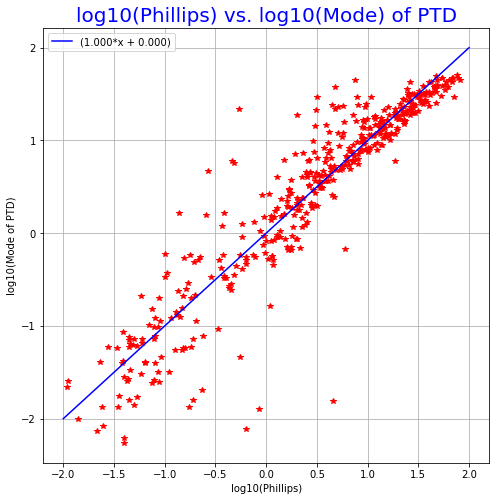

In [11]:
newX = np.linspace(-2,2 )


def myExpFunc(x, m, b):
    return x * m  +  b
popt, pcov = curve_fit(myExpFunc, df['lPhillips'],df['lMode'])
print("Linearl Fit: y = m*x + b)")
print("\tm = popt[0] = {0}\n\tb = popt[1] = {1}".format(*popt))

# r2 calculations https://newbedev.com/getting-the-r-squared-value-using-curve-fit
#residuals = ydata- f(xdata, *popt)
#ss_res = np.sum(residuals**2)
#ss_tot = np.sum((ydata-np.mean(ydata))**2)
#r_squared = 1 - (ss_res / ss_tot)
residuals = df['lMode']- myExpFunc(df['lPhillips'], *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((df['lMode']-np.mean(df['lMode']))**2)
r_squared = 1 - (ss_res / ss_tot)
print('        r2 =',round(r_squared,3))
print()


plt.figure(figsize=(8,8))
plt.plot(df['lPhillips'],df['lMode'],'r*')
plt.plot(newX, myExpFunc(newX, *popt), 'b-', label="({0:.3f}*x + {1:.3f})".format(*popt))
plt.xlabel('log10(Phillips)')
plt.ylabel('log10(Mode of PTD)')
plt.title('log10(Phillips) vs. log10(Mode) of PTD',size=20,color='blue')
plt.grid(True)
plt.legend()
plt.show()

## Calculate Actual Mode from the log10(Mode) vs. log10(Permeability) Cross Plot reqression equation:

Linearl Fit: y = m*x + b)
	m = popt[0] = 0.5071797432915114
	b = popt[1] = -0.03838795309833725
        r2 = 0.884



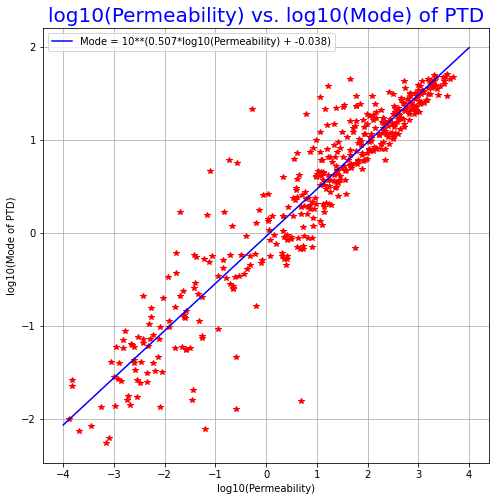

In [12]:
newX = np.linspace(-4,4 )


def myExpFunc(x, m, b):
    return x * m  +  b
popt, pcov = curve_fit(myExpFunc, df['lPerm'],df['lMode'])
print("Linearl Fit: y = m*x + b)")
print("\tm = popt[0] = {0}\n\tb = popt[1] = {1}".format(*popt))

# r2 calculations https://newbedev.com/getting-the-r-squared-value-using-curve-fit
#residuals = ydata- f(xdata, *popt)
#ss_res = np.sum(residuals**2)
#ss_tot = np.sum((ydata-np.mean(ydata))**2)
#r_squared = 1 - (ss_res / ss_tot)
residuals = df['lMode']- myExpFunc(df['lPerm'], *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((df['lMode']-np.mean(df['lMode']))**2)
r_squared = 1 - (ss_res / ss_tot)
print('        r2 =',round(r_squared,3))
print()


plt.figure(figsize=(8,8))
plt.plot(df['lPerm'],df['lMode'],'r*')
plt.plot(newX, myExpFunc(newX, *popt), 'b-', label="Mode = 10**({0:.3f}*log10(Permeability) + {1:.3f})".format(*popt))
plt.xlabel('log10(Permeability)')
plt.ylabel('log10(Mode of PTD)')
plt.title('log10(Permeability) vs. log10(Mode) of PTD',size=20,color='blue')
plt.grid(True)
plt.legend()
plt.show()

---
## In addition, Search and Discovery had an Implementation by Pittman for Sandstone:

Search and Discovery Article #40009 (2001)
Adaptation for online presentation of article entitled “Relationship of Porosity and Permeability to Various Parameters Derived from Mercury Injection-Capillary Pressure Curves for Sandstone” by the same author in AAPG Bulletin, V. 76 , 1992, p. 191-198.

Estimating Pore Throat Size in Sandstones from Routine Core-Analysis Data

by: Edward D. Pittman


Taken directly from this article:

"CONCLUSIONS:
Porosity and uncorrected air permeability from routine core analysis can be used to estimate displacement pressure for use in the equations presented by Schowalter (1979), and to estimate the pore aperture size of the apex for use in delineating traps in a manner similar to the way r35 has been used.

Among 196 sandstone samples from 14 formations, the mean apex of log-log mercury injection plots was at a mercury saturation of 36%. The empirically derived relationships among uncorrected air permeability (K in md), porosity (f in %), and the pore aperture radius (mm) corresponding to the displacement pressure and apex, respectively, can be expressed as

    Log rPd = 0.459 + 0.500 Log K - 0.385 Log f

And

    Log rapex = -0.117 + 0.475 Log k - 0.099 Log f.

Because these equations are based on uncorrected air permeabilities, the use of corrected permeability values, which would be smaller, would produce a misleadingly smaller pore-aperture-size calculation."

## Pittman's rapex vs. sqrt_k_phi:

Linearl Fit: y = a*x**b
	a = popt[0] = 3.9323117249558255
	b = popt[1] = 1.048343013057016
        r2 = 0.989



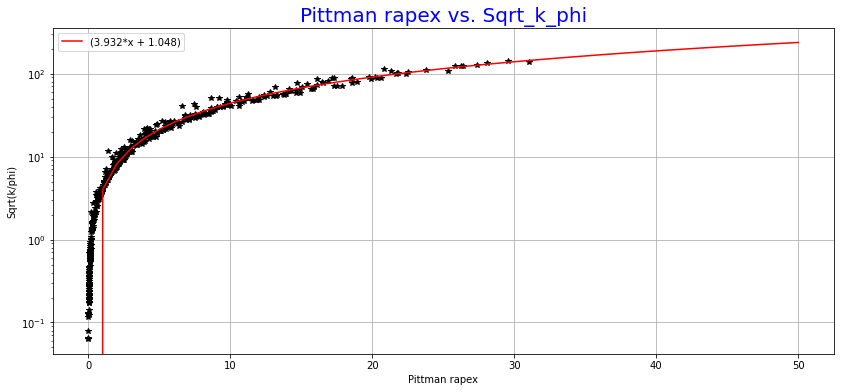

In [13]:
newX = np.linspace(0,50 )

def myExpFunc(x, a, b):
    return a*x**b


popt, pcov = curve_fit(myExpFunc, df['Pittman'],df['sqrt_k_phi'])
print("Linearl Fit: y = a*x**b")
print("\ta = popt[0] = {0}\n\tb = popt[1] = {1}".format(*popt))

#r2 calculations https://newbedev.com/getting-the-r-squared-value-using-curve-fit
#residuals = ydata- f(xdata, *popt)
#ss_res = np.sum(residuals**2)
#ss_tot = np.sum((ydata-np.mean(ydata))**2)
#r_squared = 1 - (ss_res / ss_tot)
residuals = df['sqrt_k_phi']- myExpFunc(df['Pittman'], *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((df['sqrt_k_phi']-np.mean(df['sqrt_k_phi']))**2)
r_squared = 1 - (ss_res / ss_tot)
print('        r2 =',round(r_squared,3))
print()


plt.figure(figsize=(14,6))
plt.semilogy(df['Pittman'],df['sqrt_k_phi'],'k*')
plt.semilogy(newX, myExpFunc(newX, *popt), 'r-', label="({0:.3f}*x + {1:.3f})".format(*popt))
plt.ylabel('Sqrt(k/phi)')
plt.xlabel('Pittman rapex')
plt.title('Pittman rapex vs. Sqrt_k_phi',size=20,color='blue')
plt.grid(True)
plt.legend()
plt.show()

## Pittman's rapex vs. Mode of PTD:

    **Again, the Scipy curve_fit results should not be used**

Exponential Fit: y = a*(x**b)
	a = popt[0] = 3.1225376610271582
	b = popt[1] = 0.8155406473520538
        r2 = 0.82



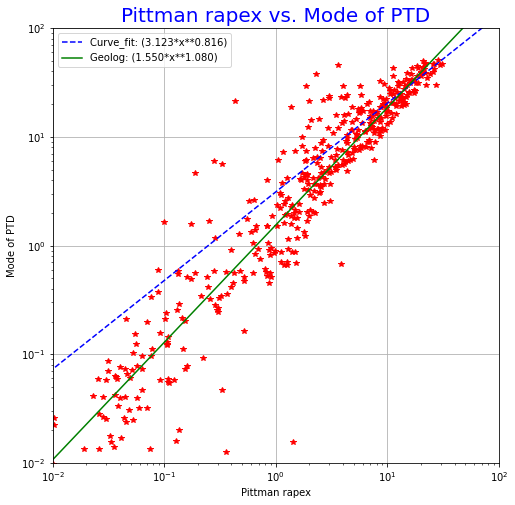

In [14]:
newX = np.logspace(-3, 3, base=10)


# Let's fit an exponential function.  
# This looks like a line on a log-log plot.
def myExpFunc(x, a, b):
    return a * np.power(x, b)

popt, pcov = curve_fit(myExpFunc, df['Pittman'],df['Mode'])
print("Exponential Fit: y = a*(x**b)")
print("\ta = popt[0] = {0}\n\tb = popt[1] = {1}".format(*popt))


# r2 calculations https://newbedev.com/getting-the-r-squared-value-using-curve-fit
#residuals = ydata- f(xdata, *popt)
#ss_res = np.sum(residuals**2)
#ss_tot = np.sum((ydata-np.mean(ydata))**2)
#r_squared = 1 - (ss_res / ss_tot)
residuals = df['Mode']- myExpFunc(df['Pittman'], *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((df['Mode']-np.mean(df['Mode']))**2)
r_squared = 1 - (ss_res / ss_tot)
print('        r2 =',round(r_squared,3))
print()




plt.figure(figsize=(8,8))
plt.loglog(df['Pittman'],df['Mode'],'r*')
plt.loglog(newX, myExpFunc(newX, *popt), 'b--', 
         label="Curve_fit: ({0:.3f}*x**{1:.3f})".format(*popt))

# Geolog fit added to plot
popt[0]=1.55
popt[1]=1.08
plt.loglog(newX, myExpFunc(newX, *popt), 'g-', 
         label="Geolog: ({0:.3f}*x**{1:.3f})".format(*popt))

plt.xlim(0.01,100)
plt.ylim(0.01,100)
plt.xlabel('Pittman rapex')
plt.ylabel('Mode of PTD')
plt.title('Pittman rapex vs. Mode of PTD',size=20,color='blue')
plt.grid(True)
plt.legend()
plt.show()

## log10(Pittman rapex) vs. log10(Mode) of PTD:

Linearl Fit: y = m*x + b)
	m = popt[0] = 1.0972959053378808
	b = popt[1] = 0.20502806071256285
        r2 = 0.882



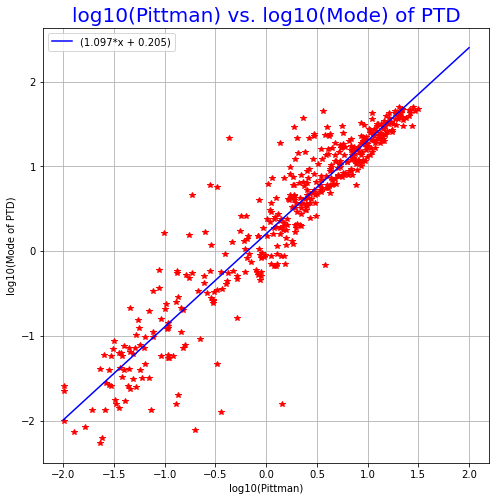

In [15]:
newX = np.linspace(-2,2 )


def myExpFunc(x, m, b):
    return x * m  +  b
popt, pcov = curve_fit(myExpFunc, df['lPittman'],df['lMode'])
print("Linearl Fit: y = m*x + b)")
print("\tm = popt[0] = {0}\n\tb = popt[1] = {1}".format(*popt))


# r2 calculations https://newbedev.com/getting-the-r-squared-value-using-curve-fit
#residuals = ydata- f(xdata, *popt)
#ss_res = np.sum(residuals**2)
#ss_tot = np.sum((ydata-np.mean(ydata))**2)
#r_squared = 1 - (ss_res / ss_tot)
residuals = df['lMode']- myExpFunc(df['lPittman'], *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((df['lMode']-np.mean(df['lMode']))**2)
r_squared = 1 - (ss_res / ss_tot)
print('        r2 =',round(r_squared,3))
print()


plt.figure(figsize=(8,8))
plt.plot(df['lPittman'],df['lMode'],'r*')
plt.plot(newX, myExpFunc(newX, *popt), 'b-', label="({0:.3f}*x + {1:.3f})".format(*popt))
plt.xlabel('log10(Pittman)')
plt.ylabel('log10(Mode of PTD)')
plt.title('log10(Pittman) vs. log10(Mode) of PTD',size=20,color='blue')
plt.grid(True)
plt.legend()
plt.show()

## Fit sqrt(k/phi) to Mode:

Exponential Fit: y = (a*(x**b))
	a = popt[0] = 1.0421142953570053
	b = popt[1] = 0.7864782539189591

Modified Exponential Fit: y = (a*(x**b)) + c
	a = popt[0] = 1.25070651763793
	b = popt[1] = 0.7498413318099468
	c = popt[2] = -0.7174443325907828



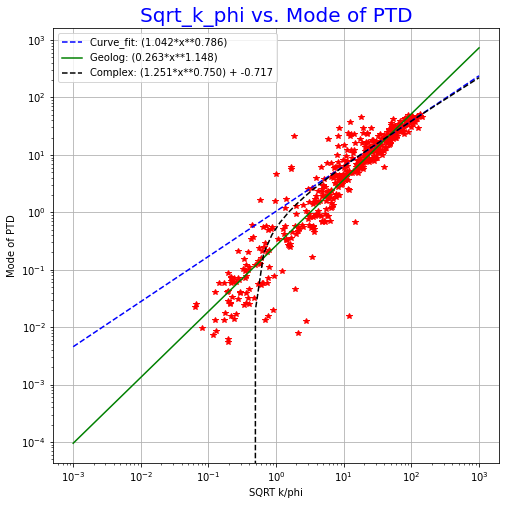

In [16]:
newX = np.logspace(-3, 3, base=10)


# Let's fit an exponential function.  
# This looks like a line on a lof-log plot.
def myExpFunc(x, a, b):
    return a * np.power(x, b)

popt, pcov = curve_fit(myExpFunc, df['sqrt_k_phi'],df['Mode'])
print("Exponential Fit: y = (a*(x**b))")
print("\ta = popt[0] = {0}\n\tb = popt[1] = {1}".format(*popt))
print()


plt.figure(figsize=(8,8))
plt.loglog(df['sqrt_k_phi'],df['Mode'],'r*')
plt.loglog(newX, myExpFunc(newX, *popt), 'b--', 
         label="Curve_fit: ({0:.3f}*x**{1:.3f})".format(*popt))

# Geolog fit added to plot
popt[0]=0.2633
popt[1]=1.14778
plt.loglog(newX, myExpFunc(newX, *popt), 'g-', 
         label="Geolog: ({0:.3f}*x**{1:.3f})".format(*popt))


# Let's fit a more complicated function.
# This won't look like a line.

def myComplexFunc(x, a, b, c):
    return a * np.power(x, b) + c

popt, pcov = curve_fit(myComplexFunc, df['sqrt_k_phi'],df['Mode'])
print("Modified Exponential Fit: y = (a*(x**b)) + c")
print("\ta = popt[0] = {0}\n\tb = popt[1] = {1}\n\tc = popt[2] = {2}".format(*popt))
print()

plt.loglog(newX, myComplexFunc(newX, *popt), 'k--', 
         label="Complex: ({0:.3f}*x**{1:.3f}) + {2:.3f}".format(*popt))
plt.xlabel('SQRT k/phi')
plt.ylabel('Mode of PTD')
plt.title('Sqrt_k_phi vs. Mode of PTD',size=20,color='blue')
plt.grid(True)
plt.legend()
plt.show()

## Added Michel Krief's equation to the Altair plots with Histograms of Mode of PTD (microns) as well as Pittman and Phillips modes:

In [17]:
interval = alt.selection_interval()

base = alt.Chart(df).properties(
    width=250,
    height=300, 
).add_selection(interval)

#------------------------------------------------
#
#       Poro-Perm Cross Plot
#
#------------------------------------------------
prt = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
    tooltip='ROCK_INDEX', 
).properties(
    title="Clerke's PRT as Color Axis",
    selection=interval
)

pointsMode = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    #size='lMode:Q',
    color=alt.condition(interval, 'lMode:Q', alt.value('lightgray'),scale=alt.Scale(
        domain=[-3,2],scheme='rainbow'),legend=None),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='Mode:Q', 
).properties(
    title='Actual Mode of PTD shown as Color Axis',
    selection=interval
)

pointsMichel = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    #size='lMode:Q',
    color=alt.condition(interval, 'lMichel:Q', alt.value('lightgray'),scale=alt.Scale(
        domain=[-3,2],scheme='rainbow'),legend=None),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='Michel:Q', 
).properties(
    title="Michel Krief's Mode of PTD",
    selection=interval
)
pointsPhillips = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    #size='lMode:Q',
    color=alt.condition(interval, 'lPhillips:Q', alt.value('lightgray'),scale=alt.Scale(
        domain=[-3,2],scheme='rainbow'),legend=None),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='Craig:Q', 
).properties(
    title="Phillips Mode of PTD",
    selection=interval
)



pointsr35 = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    #size='lr35:Q',
    color=alt.condition(interval, 'lr35:Q', alt.value('lightgray'),scale=alt.Scale(
        domain=[-3,2],scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='Winland_r35:Q', 
).properties(
    title='Winland r35 on Color Axis',
    selection=interval
)

pointsFZI = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    #size='lFZI:Q',
    color=alt.condition(interval, 'lFZI:Q', alt.value('lightgray'),scale=alt.Scale(
        domain=[-3,2],scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='FZI:Q', 
).properties(
    title='FZI on Color Axis',
    selection=interval
)

pointsRQI = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    #size='lRQI:Q',
    color=alt.condition(interval, 'lRQI:Q', alt.value('lightgray'),scale=alt.Scale(
        domain=[-3,2],scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='RQI:Q', 
).properties(
    title='RQI on Color Axis',
    selection=interval
)

#------------------------------------------------
#
#       Various Other Histograms by PRT
#
#------------------------------------------------
hist1 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('Mode:Q',
          scale=alt.Scale(type='log',domain=(.001, 100))
        ),    
    alt.Y('count():Q',scale=alt.Scale(domain=(0.0, 1.))),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),                        
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
).properties(
    title="Histogram of Clerke's Mode by Pore Throat Distribution (microns)",
    width=800,
    height=80
).transform_filter(
    interval
)

hist1a = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('Mode', aggregate='median', scale=alt.Scale(type='log', base=10,domain=(0.001, 100))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 1))),
    color=alt.value('black'),
    #strokeDash='Sample:N'
).properties(
    title='Mode',
    width=800,
    height=80,
    #selection=interval
).transform_filter(
    interval
)



hist2 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('Winland_r35:Q',
            scale=alt.Scale(type='log',domain=(.001, 100))
        ),    
    alt.Y('count():Q',scale=alt.Scale(domain=(0.0, 1.))),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),                        
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
).properties(
    title='Winland r35 (microns)',
    width=800,
    height=80
).transform_filter(
    interval
)

hist2a = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('Winland_r35', aggregate='median', scale=alt.Scale(type='log', base=10,domain=(0.001, 100))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 1))),
    color=alt.value('black'),
    #strokeDash='Sample:N'
).properties(
    title='Winland_r35',
    width=800,
    height=80,
    #selection=interval
).transform_filter(
    interval
)



hist3 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('FZI:Q',
            scale=alt.Scale(type='log',domain=(.001, 100))
        ),    
    alt.Y('count():Q',scale=alt.Scale(domain=(0.0, 1.))),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),                        
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
).properties(
    title='Amaefule FZI (microns)',
    width=800,
    height=80
).transform_filter(
    interval
)

hist3a = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('FZI', aggregate='median', scale=alt.Scale(type='log', base=10,domain=(0.001, 100))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 1))),
    color=alt.value('black'),
    #strokeDash='Sample:N'
).properties(
    title='FZI',
    width=800,
    height=80,
    #selection=interval
).transform_filter(
    interval
)







hist4 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('RQI:Q',
            scale=alt.Scale(type='log',domain=(.001, 100))
        ),    
    alt.Y('count():Q',scale=alt.Scale(domain=(0.0, 1.))),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),                        
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
).properties(
    title='Amaefule RQI',
    width=800,
    height=80
).transform_filter(
    interval
)

hist4a = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('RQI', aggregate='median', scale=alt.Scale(type='log', base=10,domain=(0.001, 100))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 1))),
    color=alt.value('black'),
    #strokeDash='Sample:N'
).properties(
    title='RQI',
    width=800,
    height=80,
    #selection=interval
).transform_filter(
    interval
)

hist5 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('Michel:Q',
            scale=alt.Scale(type='log',domain=(.001, 100))
        ),    
    alt.Y('count():Q',scale=alt.Scale(domain=(0.0, 1.))),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),                        
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
).properties(
    title="Michel Krief's Mode (microns)",
    width=800,
    height=80
).transform_filter(
    interval
)
hist5a = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('Michel', aggregate='median', scale=alt.Scale(type='log', base=10,domain=(0.001, 100))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 1))),
    color=alt.value('black'),
    #strokeDash='Sample:N'
).properties(
    title='MichelMode',
    width=800,
    height=80,
    #selection=interval
).transform_filter(
    interval
)

hist6 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('Pittman:Q',
            scale=alt.Scale(type='log',domain=(.001, 100))
        ),    
    alt.Y('count():Q',scale=alt.Scale(domain=(0.0, 1.))),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),                        
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
).properties(
    title="Pittman rapex (microns)",
    width=800,
    height=80
).transform_filter(
    interval
)
hist6a = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('Pittman', aggregate='median', scale=alt.Scale(type='log', base=10,domain=(0.001, 100))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 1))),
    color=alt.value('black'),
    #strokeDash='Sample:N'
).properties(
    title='PittmanMode',
    width=800,
    height=80,
    #selection=interval
).transform_filter(
    interval
)

hist7 = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('Phillips:Q',
            scale=alt.Scale(type='log',domain=(.001, 100))
        ),    
    alt.Y('count():Q',scale=alt.Scale(domain=(0.0, 1.))),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),                        
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
).properties(
    title="Phillips' Mode (microns)",
    width=800,
    height=80
).transform_filter(
    interval
)
hist7a = alt.Chart(df).mark_bar(clip=True).encode(
    alt.X('Phillips', aggregate='median', scale=alt.Scale(type='log', base=10,domain=(0.001, 100))),
    #x='rock_index:O',
    #y='lmode:Q',
    #y='count()',
    alt.Y('count()',scale=alt.Scale(domain=(0, 1))),
    color=alt.value('black'),
    #strokeDash='Sample:N'
).properties(
    title='PhillipsMode',
    width=800,
    height=80,
    #selection=interval
).transform_filter(
    interval
)




thomeer2 = prt | pointsMode | pointsMichel | pointsPhillips

scatter2 = pointsr35 | pointsFZI | pointsRQI

#plot2 = thomeer2 & scatter2

plot2 = thomeer2 & scatter2 & hist1+hist1a & hist7+hist7a & hist5+hist5a & hist6+hist6a  & hist2+hist2a & hist3+hist3a & hist4+hist4a  

plot2

alt.VConcatChart(...)

## Sort of a Depth Plot of Results Data:

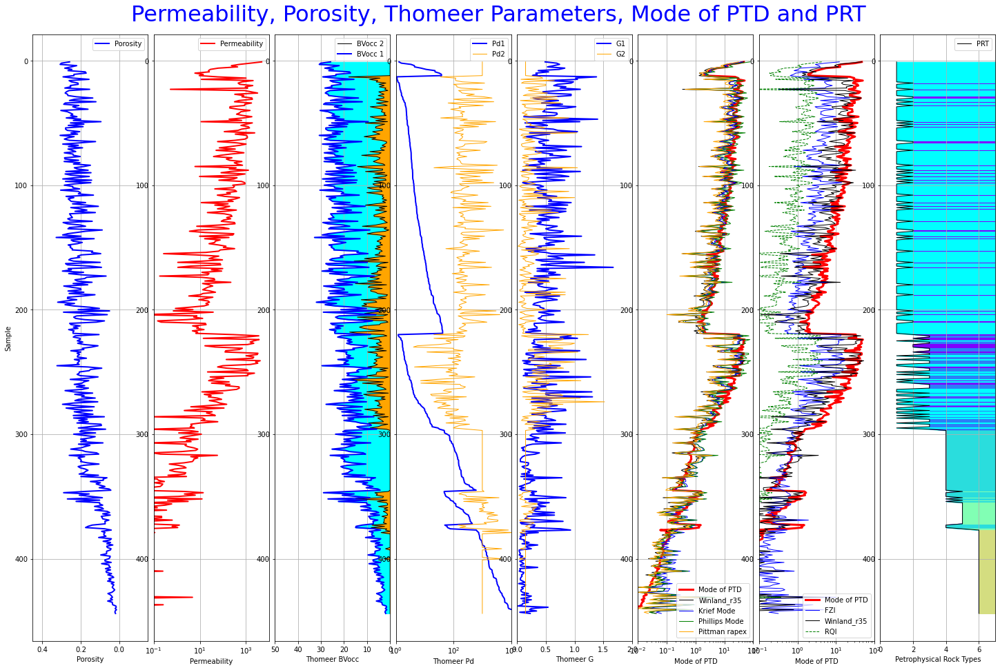

In [18]:
from matplotlib import gridspec

print()

y=np.array(df['Sample'])

fig = plt.figure(figsize=(25,15))
fig.suptitle('Permeability, Porosity, Thomeer Parameters, Mode of PTD and PRT',fontsize=32,color='blue')
fig.subplots_adjust(top=0.94,wspace=0.05, hspace =0.1)



gs = gridspec.GridSpec(1, 8)
ax1 = fig.add_subplot(gs[:,0])
ax2 = fig.add_subplot(gs[0,1])
ax3 = fig.add_subplot(gs[0,2])
ax4 = fig.add_subplot(gs[0,3])
ax5 = fig.add_subplot(gs[0,4])
ax6 = fig.add_subplot(gs[0,5])
ax7 = fig.add_subplot(gs[0,6])
ax8 = fig.add_subplot(gs[0,7])


# Porosity Logs
ax1.plot(df['Porosity'], y,'-b',lw=2, label= 'Porosity')
ax1.set_xlabel("Porosity",color='black')
ax1.set_ylabel('Sample')
ax1.invert_yaxis()
ax1.grid(True)
ax1.set_xlim(.45, -0.15)
#ax1.fill_betweenx(y,CNL,porden, facecolor='#00ff00', hatch='--//')#, label= 'VOL_DOLO')
ax1.legend()



ax2.semilogx(df['Permeability'], y,'-r',lw=2,label='Permeability')
ax2.set_xlim(0.1, 10000)
ax2.set_xlabel(('Permeability'), color='black')
ax2.legend()
#ax2=ax[2].twiny()
ax2.invert_yaxis()
ax2.grid(True)
#ax2.set_ylabel('DEPTH (feet)')
#ax2.get_yaxis().set_visible(False)




# Thomeer BVocc 
BVocc1=np.array(df['BV1'])
BVocc2=np.array(df['BV2'])

# BVocc Depth Track
ax3.plot(BVocc2, y,'-k', lw=1, label= 'BVocc 2')
ax3.plot(BVocc2+BVocc1,y,'-b',lw=2, label= 'BVocc 1')
ax3.set_xlabel("Thomeer BVocc",color='black')
ax3.set_xlim(50., 0.0)
ax3.fill_betweenx(y,BVocc2,BVocc1+BVocc2, color='cyan')#, label= 'VOL_DOLO')
ax3.fill_betweenx(y,0,BVocc2, color='orange')#, label= 'VOL_DOLO')
#ax3.get_yaxis().set_visible(False)
ax3.legend()
ax3.invert_yaxis()
ax3.grid(True)


# Thomeer Pd
Pd1=np.array(df['Pd1'])
Pd2=np.array(df['Pd2'])

# Pd Track
ax4.semilogx(Pd1, y,'-b', lw=2, label= 'Pd1')
ax4.semilogx(Pd2, y,'-',color='orange', lw=1, label= 'Pd2')
ax4.set_xlabel("Thomeer Pd",color='black')
ax4.set_xlim(1, 10000)
ax4.legend()
ax4.invert_yaxis()
ax4.grid(True)
#ax4.set_ylabel('DEPTH (feet)')


# Thomeer G
G1=np.array(df['G1'])
G2=np.array(df['G2'])

# Thomeer G
ax5.plot(G1, y,'-b', lw=2, label= 'G1')
ax5.plot(G2, y,'-', color='orange', lw=1, label= 'G2')
ax5.set_xlabel("Thomeer G",color='black')
ax5.set_xlim(0, 2.0)
ax5.legend()
ax5.invert_yaxis()
ax5.grid(True)



# Error Theoretical vs. Actual normalized logs

ax6.semilogx(df['Mode'], y,'-r', lw=3, label= 'Mode of PTD')
ax6.plot(df['Winland_r35'], y,'-k', lw=1, label= 'Winland_r35')
ax6.plot(df['Michel'], y,'-b', lw=1, label= 'Krief Mode')
ax6.plot(df['Phillips'], y,'-g', lw=1, label= 'Phillips Mode')
ax6.plot(df['Pittman'], y,'-', color='orange', lw=1, label= 'Pittman rapex')


ax6.set_xlabel("Mode of PTD",color='black')
ax6.set_xlim(0.01, 100.0)
#ax6.fill_betweenx(y,porarray,bvw, color='green')#, label= 'VOL_DOLO')
#ax6.fill_betweenx(y,bvw,0, color='cyan')#, label= 'VOL_DOLO')
ax6.legend()
ax6.invert_yaxis()
ax6.grid(True)



# Permeability
ax7.semilogx(df['Mode'], y,'-r', lw=3, label= 'Mode of PTD')
ax7.semilogx(df['FZI'], y,'-b', lw=1, label= 'FZI')
ax7.semilogx(df['Winland_r35'], y,'-k', lw=1, label= 'Winland_r35')
ax7.semilogx(df['RQI'], y,'--g', lw=1, label= 'RQI')
ax7.set_xlabel("Mode of PTD",color='black')
ax7.set_xlim(0.1, 100.0)
ax7.legend()
ax7.invert_yaxis()
ax7.grid(True)




# Rock Index or PRT
ax8.plot(df['ROCK_INDEX'], y,'-k', lw=1, label= 'PRT')
ax8.set_xlabel("Petrophysical Rock Types",color='black')
ax8.set_xlim(0., 7.0)
ax8.fill_betweenx(y,df['ROCK_INDEX'],7, color='cyan')
ax8.legend()
ax8.invert_yaxis()
ax8.grid(True)

## Setting Up Shading for GR
left_col_value = 2
right_col_value = 7
span = abs(left_col_value - right_col_value)
cmap = plt.get_cmap('rainbow')
#cmap = plt.get_cmap('cool')

color_index = np.arange(left_col_value, right_col_value, span / 6)
#loop through each value in the color_index
for index in sorted(color_index):
    index_value = (index - left_col_value)/span
    color = cmap(index_value) #obtain color for color index value
    ax8.fill_betweenx(y, df['ROCK_INDEX'] , right_col_value, where = df['ROCK_INDEX'] >= index,  color = color)



## This is an Altair Plot by PRT bar charts for another visualization:

In [19]:
interval = alt.selection_interval()

base = alt.Chart(df).properties(
    width=250,
    height=300, 
).add_selection(interval)

#------------------------------------------------
#
#       Poro-Perm Cross Plot
#
#------------------------------------------------
prt = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
    tooltip='ROCK_INDEX', 
).properties(
    title="Clerke's PRT as Color Axis",
    selection=interval
)

pointsMode = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    #size='lMode:Q',
    color=alt.condition(interval, 'lMode:Q', alt.value('lightgray'),scale=alt.Scale(
        domain=[-3,2],scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='Mode:Q', 
).properties(
    title='Actual Mode of PTD shown as Color Axis',
    selection=interval
)

pointsr35 = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    #size='lr35:Q',
    color=alt.condition(interval, 'lr35:Q', alt.value('lightgray'),scale=alt.Scale(
        domain=[-3,2],scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='Winland_r35:Q', 
).properties(
    title='Winland r35 on Color Axis',
    selection=interval
)

pointsFZI = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    #size='lFZI:Q',
    color=alt.condition(interval, 'lFZI:Q', alt.value('lightgray'),scale=alt.Scale(
        domain=[-3,2],scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='FZI:Q', 
).properties(
    title='FZI on Color Axis',
    selection=interval
)

pointsRQI = base.mark_point(filled=True, size=100).encode(
    x='Porosity:Q',
    y='lPerm:Q',
    #size='lRQI:Q',
    color=alt.condition(interval, 'lRQI:Q', alt.value('lightgray'),scale=alt.Scale(
        domain=[-3,2],scheme='rainbow')),
    #color=alt.condition(selector, 'Well_Name:O', alt.value('lightgray'), legend=None),
    tooltip='RQI:Q', 
).properties(
    title='RQI on Color Axis',
    selection=interval
)

#------------------------------------------------
#
#       Various Other Histograms by PRT
#
#------------------------------------------------
hist1 = alt.Chart(df).mark_bar().encode(
    alt.X('Mode:Q',
            scale=alt.Scale(type='log',domain=(.001, 100))
        ),    
    alt.Y('ROCK_INDEX:O'),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),                        
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
).properties(
    title='Clerke Mode by PRT (microns)',
    width=800,
    height=80
#).transform_filter(
#    interval
)

hist2 = alt.Chart(df).mark_bar().encode(
    alt.X('Winland_r35:Q',
            scale=alt.Scale(type='log',domain=(.001, 100))
        ),    
    alt.Y('ROCK_INDEX:O'),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),                        
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
).properties(
    title='Winland r35 by PRT (microns)',
    width=800,
    height=80
#).transform_filter(
#    interval
)

hist3 = alt.Chart(df).mark_bar().encode(
    alt.X('FZI:Q',
            scale=alt.Scale(type='log',domain=(.001, 100))
        ),    
    alt.Y('ROCK_INDEX:O'),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),                        
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
).properties(
    title='Amaefule FZI by PRT (microns)',
    width=800,
    height=80
#).transform_filter(
#    interval
)

hist4 = alt.Chart(df).mark_bar().encode(
    alt.X('RQI:Q',
            scale=alt.Scale(type='log',domain=(.001, 100))
        ),    
    alt.Y('ROCK_INDEX:O'),
    color=alt.condition(interval, 'ROCK_INDEX:O', alt.value('lightgray'),                        
                        scale=alt.Scale(
                        domain=[ 1,         2,         3,      4,      5,        6   ],
                        range =['cyan', 'dodgerblue','blue','yellow','orange','brown'])),
).properties(
    title='Amaefule RQI by PRT',
    width=800,
    height=80
#).transform_filter(
#    interval
)




thomeer2 = prt | pointsMode

scatter2 = pointsr35 | pointsFZI | pointsRQI

#plot2 = thomeer2 & scatter2

plot2 = thomeer2 & scatter2 & hist1 & hist2 & hist3 & hist4

plot2

alt.VConcatChart(...)